In [1]:
import glob
import multiprocessing as mp
import matplotlib.pyplot as plt
import numpy as np
import os
import oscdeeppy as odp
from importlib import reload

# Image Lists

In [2]:
DTYPE = np.float32 # Not sure what int types will do; float64 is probably overkill 
BLACKPOINT_SIGMA=2.7 # Larger tends to make darker images
SYMMETRY_SIGMA = 0.5 # offset from background peak in terms of backgroun sigma for stretching

ImageSet = odp.FITSSet
bias = glob.glob('../astro/asi2600mc_calibrations/bias_n10C/*.fits')
darks_180 = glob.glob('../astro/asi2600mc_calibrations/dark_n10C_180s/*.fits')
darks_300 = glob.glob('../astro/asi2600mc_calibrations/dark_n10C_300s/*.fits')
FLAT_DARK_SCALING_FACTOR = 0.0
LIGHT_DARK_SCALING_FACTOR = 1.0

darks = darks_300
#flats = glob.glob('../astro/2024-09-08*/*Triangulum*/Flat/*.fits')
#lights = glob.glob('../astro/2024*Veil*/Light/*.fits')
#DRIZZLE = True
#tag = 'ngc6992_veil_nebula_asi2600mc'

#darks = darks_300
#flats = glob.glob('../astro/2024-09-08*/*Triangulum*/Flat/*.fits')
#lights = glob.glob('../astro/2024-09-08*/*Triangulum*/Light/*.fits')
#DRIZZLE = True
#tag = 'm33_triangulum_asi2600mc'

darks = darks_180
flats = glob.glob('../astro/2024-09-14*/flats/*.fits')
lights = glob.glob('../astro/2024-09-14*/*Andromeda*/Light/*.fits')
DRIZZLE = True
tag = 'm31_andromeda_asi2600mc'

#bias = glob.glob('bias/*.ARW')[:100]
#darks = glob.glob('darks/*.ARW')[:100]
#DARK_EXPOSURE_TIME = 30
#ImageSet = odp.RawSet

#flats = glob.glob('../astro/2024-02-24*/flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/10s exposures vs 30s exposures
#lights = glob.glob('../astro/2024-02-24*/lights/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm101_whirlpool' # FIXME double check

#flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW') # Did I really not take flats for orion...
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/10s exposures vs 30s exposures
#lights = glob.glob('../astro/2023-12-13*/Orion*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 120/DARK_EXPOSURE_TIME # 120s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'orion_nebula'

#flats = glob.glob('../astro/2024-02-08*/flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/2024-02-08*/M81*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm81_bode_m82_cigar_v2'

#flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/2023-12-15*/Andromeda*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'andromeda'

#flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/2023-12-15*/Triangulum*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'triangulum'

#flats = glob.glob('../astro/*M51*/flats/*.ARW')[:100]
#lights = glob.glob('../astro/*M51*/*M51*/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm51_whirlpool_galaxy'

#flats = glob.glob('../astro/*Leo Triplet*/flats/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Leo Triplet*/*Leo Triplet*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'leo_triplet'

#flats = glob.glob('flats_v3/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Markarian*/*Markarian*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 500/DARK_EXPOSURE_TIME # 500s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'markarians_chain_v5'

#flats = glob.glob('flats_v3/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Lagoon*/Lagoon*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'lagoon_nebula_v2'

print(len(bias),len(flats),len(darks),len(lights))

100 100 50 31


# Calibration Data Processing

In order to image very dim objects, one requires a very sensitive and very well calibrated sensor. Data taken in contrived situations (very short exposure, lens cap on or off, pointed at uniform white surface, etc) provide footholds for calculating unknown quantities in the imaging system, like precise per-pixel sensitivity, positions of dust shadows, hot/dead pixels etc.

## Bias

Bias frames are taken fast at the same gain as light and dark to capture constant offsets in all images.

In [3]:
bias_set = ImageSet(bias)

### Stacking

In [4]:
bias_avg = odp.simple_stack(bias_set, dtype=DTYPE, verbose=True)

### Histogram

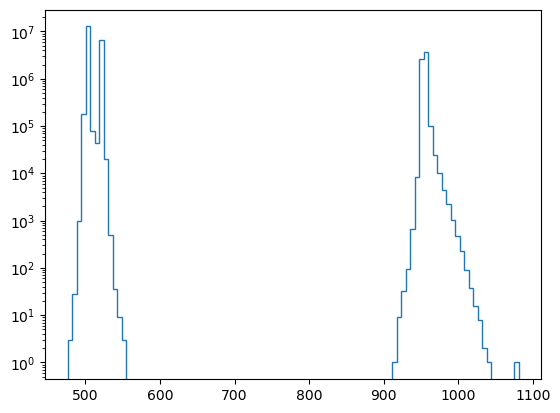

In [5]:
plt.hist(bias_avg.flatten(), bins=100, histtype='step',label='Bias Avg')
plt.yscale('log')

## Dark

Dark frames are long exposure at the same gain as light frames, but with the sensor dark. These capture noise that builds with time. Helpful to have the same exposure time as light frames, but can be scaled to compensate. The bias must be subtracted from the dark frames.

In [6]:
dark_set = ImageSet(darks)

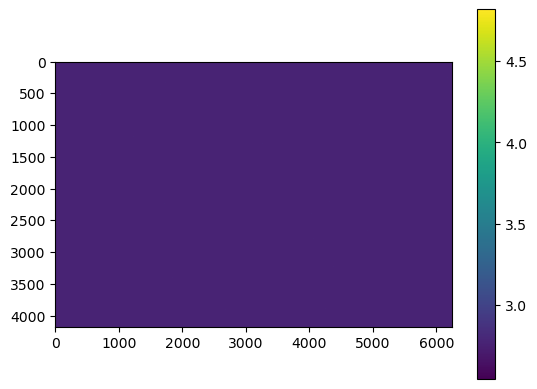

In [7]:
plt.imshow(np.log10(np.clip(dark_set[0],1e-15,None)))
plt.colorbar()

### Stacking

In [8]:
dark_avg = odp.simple_stack(dark_set, dtype=DTYPE, verbose=True)

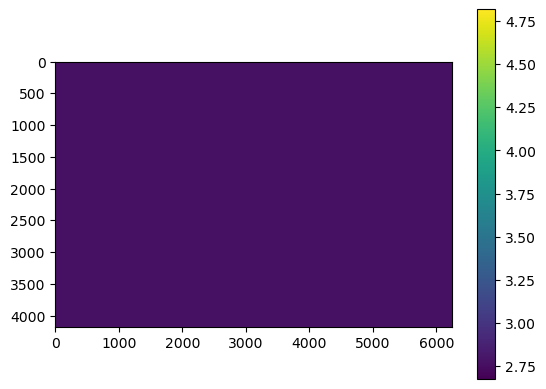

In [9]:
plt.imshow(np.log10(np.clip(dark_avg,1e-15,None)))
plt.colorbar()

### Bias Subtraction

In [10]:
dark_unbiased = dark_avg - bias_avg

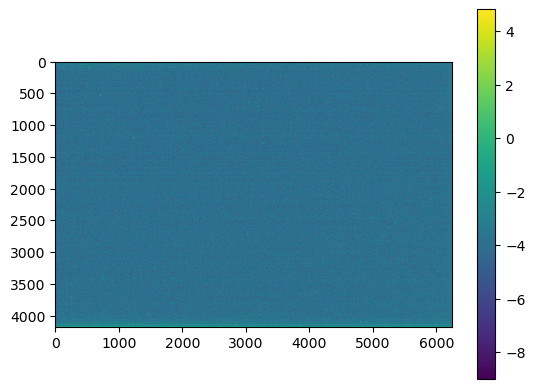

In [11]:
plt.imshow(np.log10(np.clip(dark_unbiased,1e-9,None)))
plt.colorbar()

### Histogram

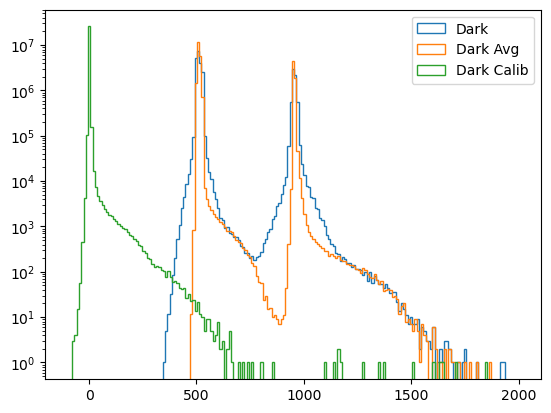

In [12]:
plt.hist(dark_set[0].ravel(), bins=np.linspace(-100,2000,200), histtype='step',label='Dark')
plt.hist(dark_avg.ravel(), bins=np.linspace(-100,2000,200), histtype='step',label='Dark Avg')
plt.hist(dark_unbiased.ravel(), bins=np.linspace(-100,2000,200), histtype='step',label='Dark Calib')
plt.yscale('log')
plt.legend()

## Flat

Flats capture nonuniform response to light in the optical system due to imperfections in the telescope/lens, dust on the sensor, or senor response itself. This corrects for effects similar to vignetting as well. The bias (recommended) and darks (optional) should be subtracted from the flats. Flats are normalized so that the multiplicative effect does not modify the mean intensity of a uniform image.

In [13]:
flat_set = ImageSet(flats)

### Bias & Dark Subtraction

In [14]:
def bias_dark_subtact(img, bias, dark, factor):
    return img - bias - dark*factor

In [15]:
flat_calib_set = odp.DiskSet('flat_calib.apy',recreate=True, dtype=DTYPE, num_img=len(flat_set), img_shape=flat_set.img_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(bias_dark_subtact, flat_set, args=(bias_avg, dark_unbiased, FLAT_DARK_SCALING_FACTOR), output_set=flat_calib_set, verbose=True)

100%|█████████████████████████████████████████| 100/100 [00:40<00:00,  2.49it/s]


### Stacking

In [16]:
flat_avg = odp.simple_stack(flat_calib_set, dtype=DTYPE, verbose=True)

### Debayering

In [17]:
flat_debayer = odp.debayer_full(flat_avg)

### Normalization

In [18]:
flat_norm = flat_debayer/np.mean(np.mean(flat_debayer,axis=0),axis=0)
flat_norm[flat_norm == 0.0] = 1.0

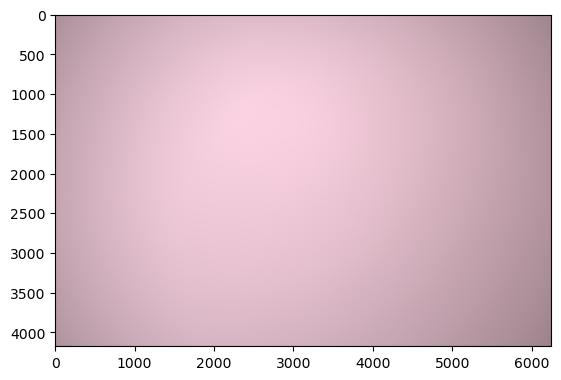

In [19]:
odp.display_rgb(flat_norm)

# Light Image Processing

In [20]:
light_set = ImageSet(lights)

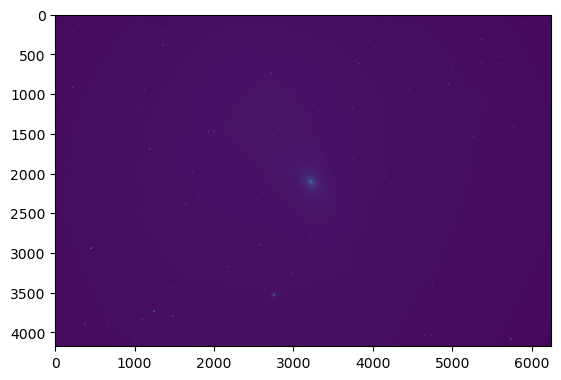

In [21]:
plt.imshow(light_set[0])

## Bias, Dark, & Flat Calibration + Debayer

In [22]:
bias_master = bias_avg
dark_master = dark_unbiased
flat_master = flat_norm

def calibrate_light_img(img, dark_factor):
    '''
    dark_master and flat_master should be bias subtracted
    '''
    return odp.debayer_full(img - bias_master - dark_master*dark_factor) / flat_master

In [23]:
light_calib_set = odp.DiskSet('light_calib.apy',recreate=True, dtype=DTYPE, num_img=len(light_set), img_shape=light_set.img_shape+(3,))

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(calibrate_light_img, light_set, args=(LIGHT_DARK_SCALING_FACTOR,), output_set=light_calib_set, verbose=True)

100%|███████████████████████████████████████████| 31/31 [00:19<00:00,  1.63it/s]


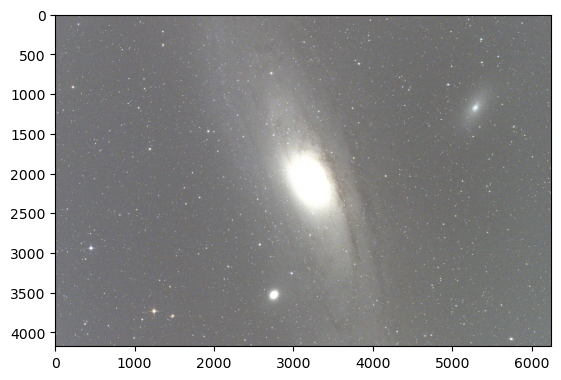

In [24]:
odp.display_rgb(light_calib_set[0], scale='auto')

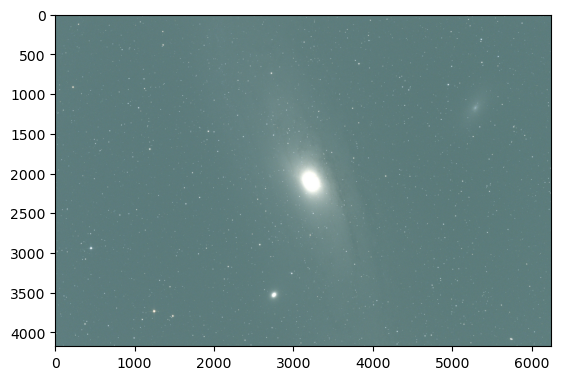

In [25]:
odp.display_rgb(light_calib_set[0], scale='linear', clip_sigmas=5)

## Background Extraction

In [26]:
light_calib_bkg_set = odp.DiskSet('light_calib_bkg.apy',recreate=True, dtype=DTYPE, num_img=len(light_calib_set), img_shape=light_calib_set.img_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(odp.polyfit_bkg_extract, light_calib_set, output_set=light_calib_bkg_set, verbose=True)

100%|███████████████████████████████████████████| 31/31 [01:53<00:00,  3.67s/it]


Image 0


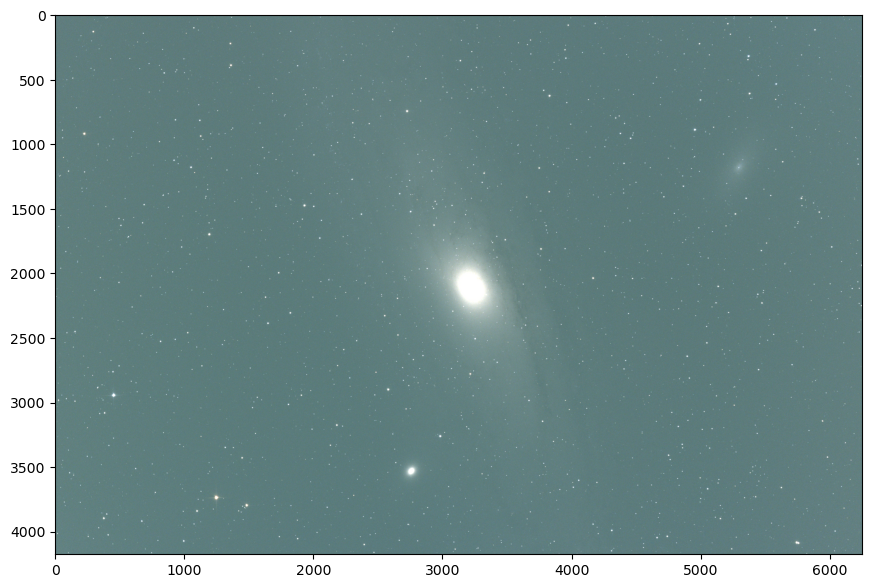

In [27]:
for i in range(len(light_calib_bkg_set)):
    print(f'Image {i}')
    plt.figure(figsize=[14,7])
    odp.display_rgb(light_calib_bkg_set[i],scale='linear',clip_sigmas=5)
    plt.show()
    plt.close()
    break

## Find Stars

Fit(151): Optimization terminated successfully.
FWHM 4.709640090061899 ECC 0.0 SNR 4.111572836203692 LVL 55794.3203125 DIST 104.70302136127839
Candidate Excluded
Fit(817): Optimization terminated successfully.
FWHM 14.683967986684873 ECC 0.5712524107672634 SNR 1.6834387619771058 LVL 20501.856132197077 DIST 11.273046633860059
Candidate Excluded
Fit(122): Optimization terminated successfully.
FWHM 4.709640090061899 ECC 0.0 SNR 3.9450790709971875 LVL 55794.3203125 DIST 80.15773173014077
Candidate Excluded
Fit(409): Optimization terminated successfully.
FWHM 8.59903317422126 ECC 0.5928773662268227 SNR 8.463326308182168 LVL 49512.134522473956 DIST 0.3593382185649923


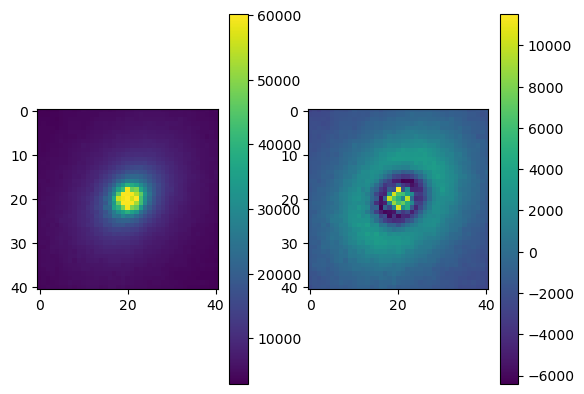

Fit(402): Optimization terminated successfully.
FWHM 3.2147759172461434 ECC 0.6664813494859065 SNR 11.090144319211962 LVL 48562.63076952632 DIST 5.115527652800188
Candidate Excluded
Fit(477): Optimization terminated successfully.
FWHM 9.427728026402393 ECC 0.3920598885582593 SNR 33.09478346689594 LVL 77469.76968148001 DIST 1.0085774097652074


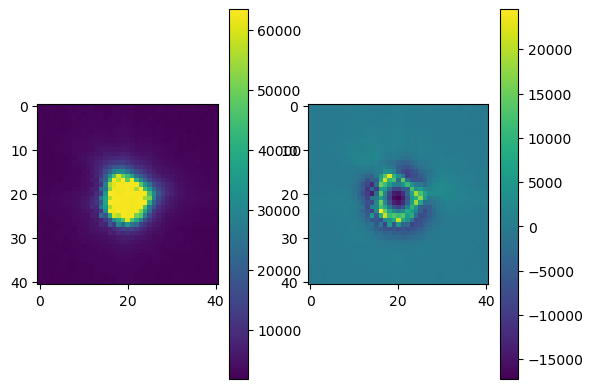

array([[2.75835888e+03, 3.53298186e+03, 8.59903317e+00, 4.95121345e+04,
        5.85019799e+03, 5.92877366e-01],
       [1.24879992e+03, 3.73898853e+03, 9.42772803e+00, 7.74697697e+04,
        2.34084534e+03, 3.92059889e-01]])

In [28]:
#Just to demo
odp.find_stars(light_calib_bkg_set[0], num_stars=2, patch_radius=20, snr_min=5, verbose=True)

In [29]:
with odp.ImageProcessor(nproc=16) as proc:
    reg_stars = proc.map(odp.find_stars, light_calib_bkg_set, num_stars=250, patch_radius=20, snr_min=5, verbose=True)

100%|███████████████████████████████████████████| 31/31 [00:48<00:00,  1.57s/it]


Image 0 FWHM 3.894 ECC 0.595


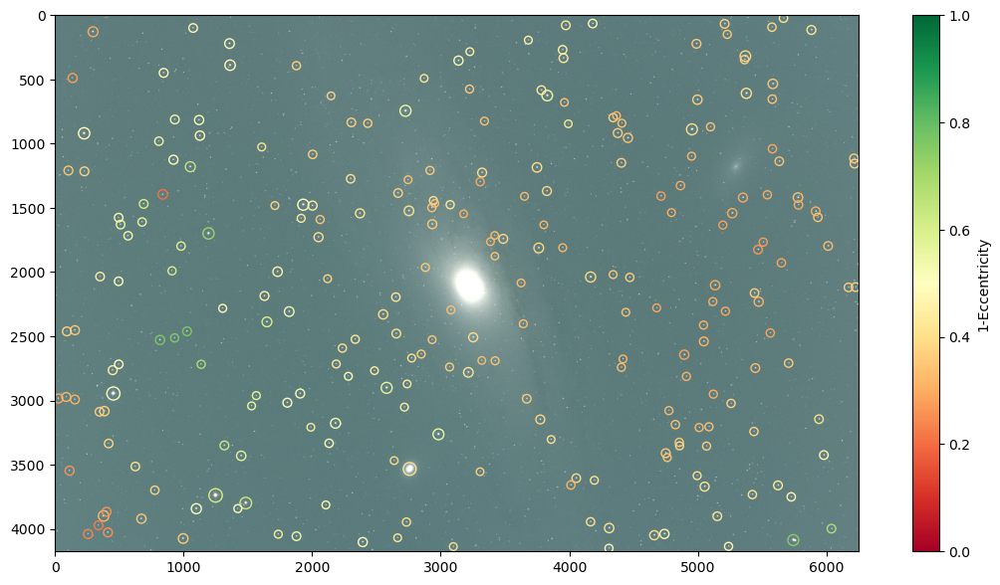

In [30]:
from matplotlib import colormaps
cmap = colormaps['RdYlGn']

for i,(img,stars) in enumerate(zip(light_calib_bkg_set,reg_stars)):
    print(f'Image {i} FWHM {np.mean(stars[:,2]):0.3f} ECC {np.mean(stars[:,5]):0.3f}')
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    sc = plt.scatter(stars[:,0], stars[:,1], s=10*stars[:,2], fc='none', ec=cmap(1.0-stars[:,5]))
    plt.colorbar(sc,label='1-Eccentricity')
    sc.set_cmap(cmap)
    sc.set_clim(0,1)
    plt.show()
    plt.close()
    break

## Find Constellations

In [31]:
with mp.Pool(16) as pool:
    reg_consts = pool.map(odp.build_constellations,reg_stars)

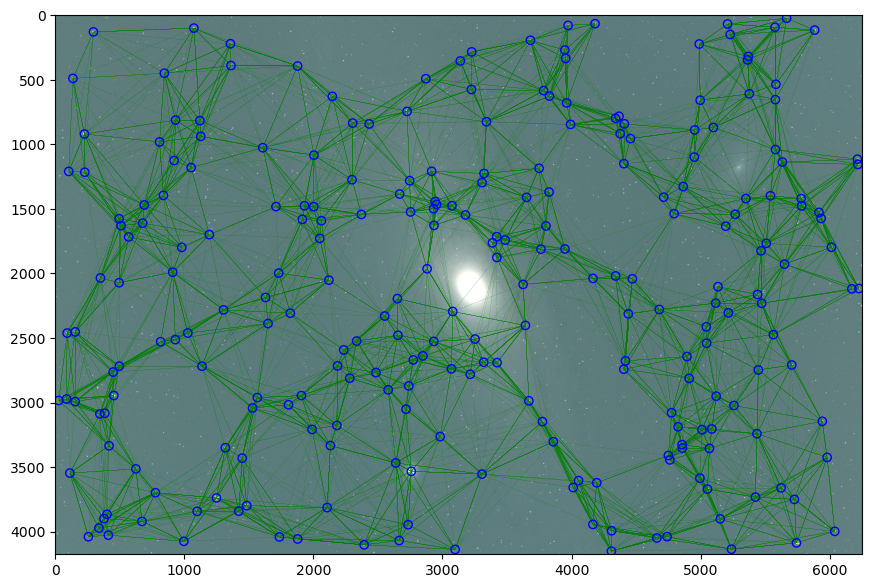

In [32]:
for i,(img,stars,tris) in enumerate(zip(light_calib_bkg_set,reg_stars,reg_consts)):
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    odp.draw_constellations(tris, color='g', alpha=1.0, linewidth=0.1)
    plt.scatter(stars[:,0], stars[:,1], fc='none', ec='b')
    plt.show()
    plt.close()
    break

## Find Alignment Transformations

In [33]:
ref_idx = 0

import itertools
import functools

class ref_skip:
    '''For a starmap operation, this can wrap a function to skip processing a specific index and return 
       a fixed value (usually None) instead. Assumes whatever you would have iterated over with the bare 
       function is instead wrapped in enumerate'''
    
    def __init__(self, f, ref_idx, ref_val=None):
        self.f = f
        self.ref_idx = ref_idx
        self.ref_val = ref_val
        
    def __call__(self, i, args, **kwargs):
        if i == self.ref_idx:
            return self.ref_val
        else:
            return self.f(*args, **kwargs)

ft = functools.partial(odp.find_transformation, max_iter=10)

with mp.Pool(16) as pool:
    const_pairs = pool.starmap(ref_skip(odp.find_corresponding_constellations,ref_idx), enumerate(zip(itertools.repeat(reg_consts[ref_idx]),reg_consts)))
    star_pairs = pool.starmap(ref_skip(odp.find_corresponding_points,ref_idx), enumerate(const_pairs))
    fit_txs = pool.starmap(ref_skip(ft,ref_idx), enumerate(star_pairs))

Image 1
          message: Optimization terminated successfully.
          success: True
           status: 0
              fun: 0.4160024983878704
                x: [-6.246e+01 -7.369e+01 -7.342e-04]
              nit: 7
            direc: [[ 2.089e-01 -4.165e-01 -1.351e-04]
                    [ 0.000e+00  1.000e+00  0.000e+00]
                    [-2.125e-03 -4.479e-04 -1.149e-09]]
             nfev: 270
 average_distance: 0.4160024983878704
      total_stars: 210
        star_mask: [ True  True ...  True  True]


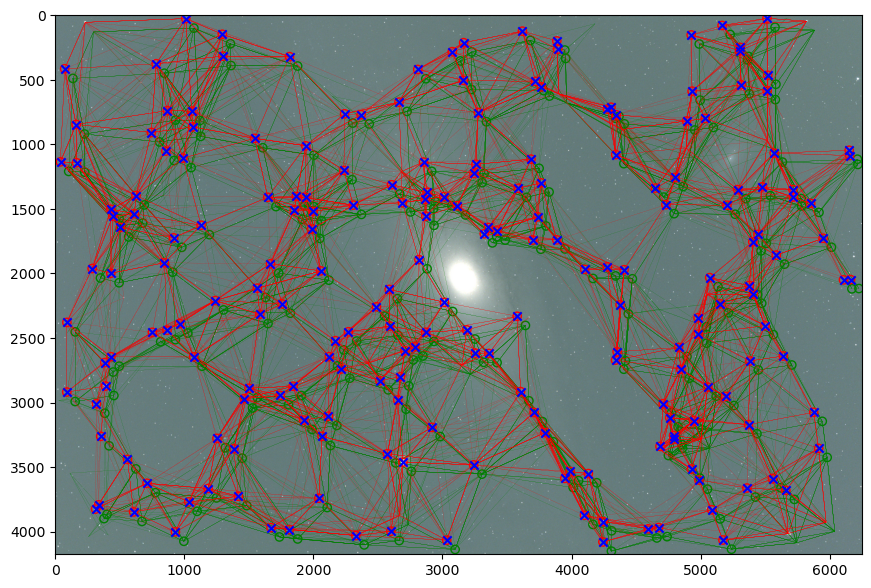

Image 2
          message: Optimization terminated successfully.
          success: True
           status: 0
              fun: 0.3340943098744266
                x: [-5.112e+01 -4.185e+01 -6.410e-04]
              nit: 6
            direc: [[ 1.000e+00  0.000e+00  0.000e+00]
                    [ 9.670e-01 -1.132e+00 -2.768e-04]
                    [ 4.070e-04 -8.304e-04 -9.328e-07]]
             nfev: 221
 average_distance: 0.3340943098744266
      total_stars: 210
        star_mask: [ True False ...  True  True]


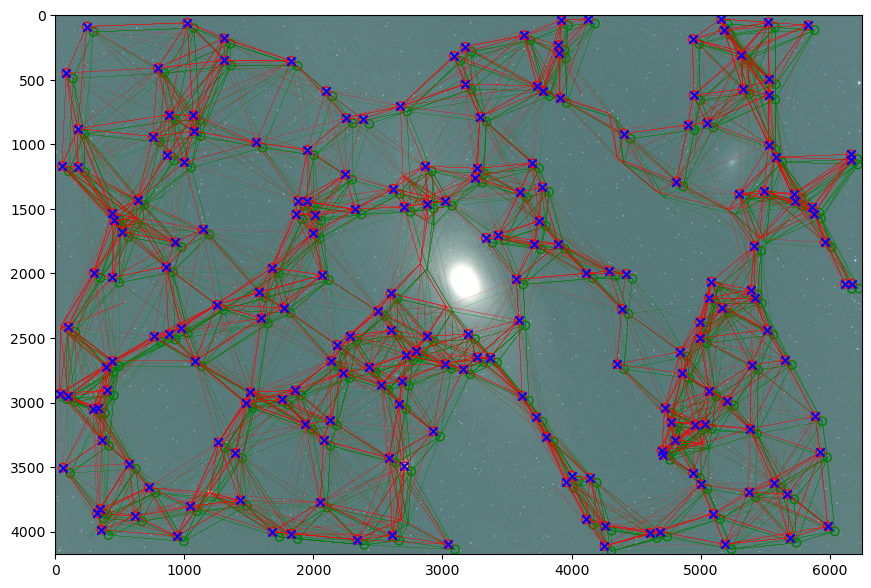

In [34]:
for i,(img,stars,tris,fit) in enumerate(zip(light_calib_bkg_set,star_pairs,const_pairs,fit_txs)):
    if ref_idx == i:
        continue
    print(f'Image {i}')
    
    print(fit)
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    stars_a,stars_b,mean_rot,mean_tx = stars
    tris_a,tris_b = tris
    odp.draw_constellations(tris_a, color='g', alpha=1.0, linewidth=0.1)
    plt.scatter(stars_a[fit.star_mask,0], stars_a[fit.star_mask,1], fc='none', ec='g')
    odp.draw_constellations(tris_b, color='r', alpha=1.0, linewidth=0.1)
    plt.scatter(stars_b[fit.star_mask,0], stars_b[fit.star_mask,1], fc='none', ec='r')
    stars_a_tx = odp.transform_coords(stars_a[fit.star_mask,:2],*fit.x)
    plt.scatter(stars_a_tx[:,0], stars_a_tx[:,1], c='b', marker='x')
    plt.show()
    plt.close()
    if i >= 2: break

## Image Selection

Based on metrics determined during star finding and alignment.

Text(0.5, 0, 'eccentricity')

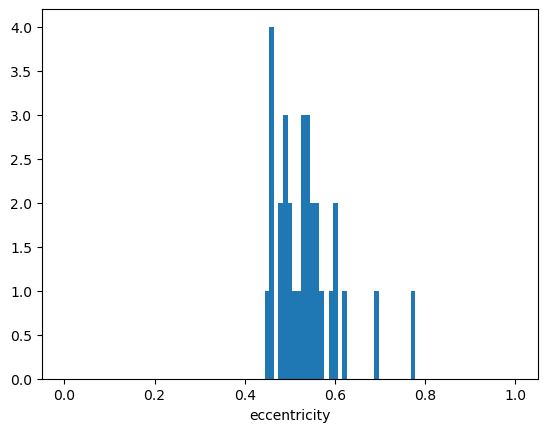

In [35]:
eccentricity = np.asarray([np.mean(star[:,5]) for star in reg_stars])
plt.hist(eccentricity,bins=np.linspace(0,1,100))
plt.xlabel('eccentricity')

Text(0.5, 0, 'fwhm')

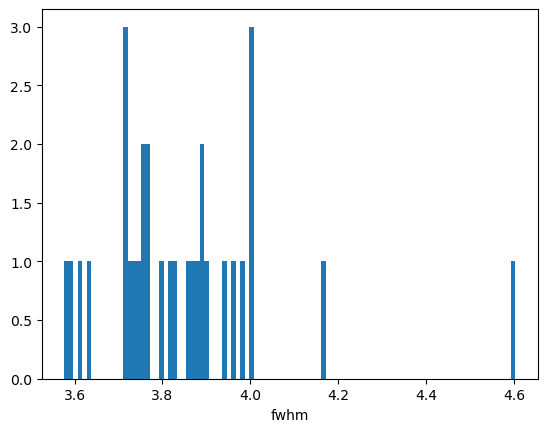

In [36]:
fwhm = np.asarray([np.mean(star[:,2]) for star in reg_stars])
plt.hist(np.clip([np.mean(star[:,2]) for star in reg_stars],0,10),bins=100)
plt.xlabel('fwhm')

Text(0.5, 0, 'total stars')

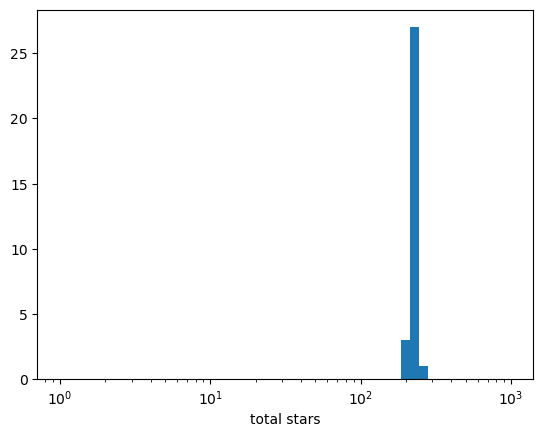

In [37]:
total_stars = np.asarray([fit.total_stars if fit else len(reg_stars[ref_idx]) for fit in fit_txs ])
plt.hist(total_stars,bins=np.logspace(0,3))
plt.xscale('log')
plt.xlabel('total stars')

Text(0.5, 0, 'average tx distance')

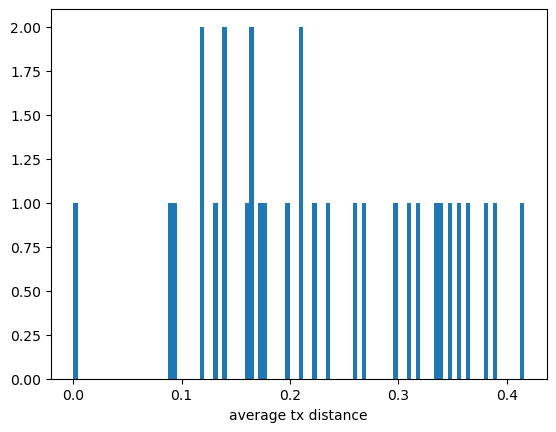

In [38]:
avg_dist = np.asarray([fit.average_distance if fit else 0.0 for fit in fit_txs ])
plt.hist(np.clip(avg_dist,0,10),bins=100)
plt.xlabel('average tx distance')

[ True  True  True  True False  True  True  True  True  True  True  True
  True  True  True  True  True False  True  True  True  True  True  True
  True  True  True  True  True  True  True]
Total Lights: 31; Lights Used: 29
Rejected 4: FWHM 4.1707749216464824 ECC 0.6889294609834831 TOT 224 DIST 0.16039472437273142


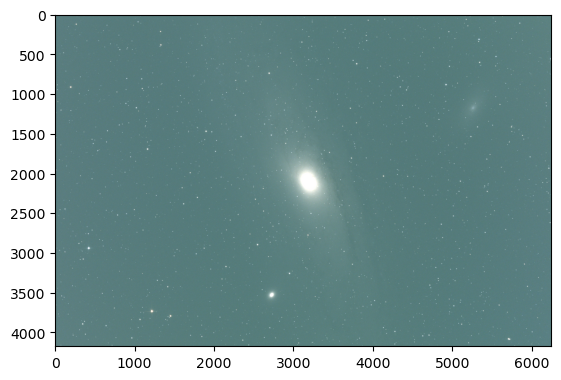

Rejected 17: FWHM 4.602619737321637 ECC 0.7687923164787487 TOT 217 DIST 0.09284110464574953


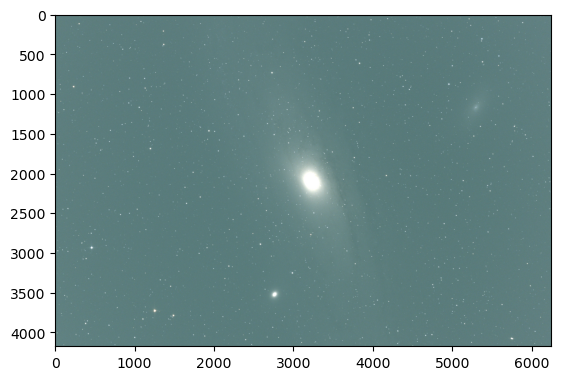

In [39]:
def median_sigma_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return np.abs(values - m) < sigmas*s

def median_sigma_max_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return values - m < sigmas*s
    
def median_sigma_min_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return m - values < sigmas*s

star_selection = median_sigma_max_cut(fwhm, 1.5) & median_sigma_min_cut(eccentricity, 1.5)
fit_selection = (total_stars >= 10) & median_sigma_max_cut(avg_dist, 2)
selection = star_selection & fit_selection
print(selection)
print(f'Total Lights: {len(selection)}; Lights Used: {np.count_nonzero(selection)}')
for i,sel in enumerate(selection):
    if not sel:
        print(f'Rejected {i}: FWHM {fwhm[i]} ECC {eccentricity[i]} TOT {total_stars[i]} DIST {avg_dist[i]}')
        odp.display_rgb(light_calib_bkg_set[i],scale='linear',clip_sigmas=5)
        plt.show()
        plt.close()

## Transform Images

In [40]:
transformed_shape = tuple((x*2 if DRIZZLE else x) if i < 2 else x for i,x in enumerate(light_calib_bkg_set.img_shape))

light_regtx = odp.DiskSet('light_calib_bkg_reg.apy', recreate=True, dtype=DTYPE, num_img=np.count_nonzero(selection), img_shape=transformed_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(odp.image_transform_chunked, light_calib_bkg_set, fit_txs, drizzle=DRIZZLE, output_set=light_regtx, selection=selection, verbose=True)

100%|███████████████████████████████████████████| 29/29 [00:45<00:00,  1.56s/it]


## Stacking (Winsor Implementation)

In [41]:
summed,counts = odp.winsor_stack(light_regtx, nproc=16, verbose=True, return_counts=True)

Stacking with winzor quantiles [0.030, 0.970]
Total jobs to run: 117


Winsor quantiles: 100%|███████████████████████| 117/117 [02:17<00:00,  1.18s/it]


In [42]:
np.count_nonzero(counts==0)

0

In [43]:
np.count_nonzero(np.isnan(counts))

0

In [44]:
stacked = summed/np.clip(counts,1,None)

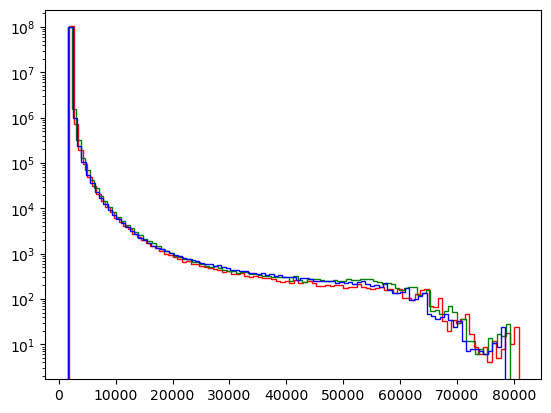

In [45]:
odp.show_hist(stacked)

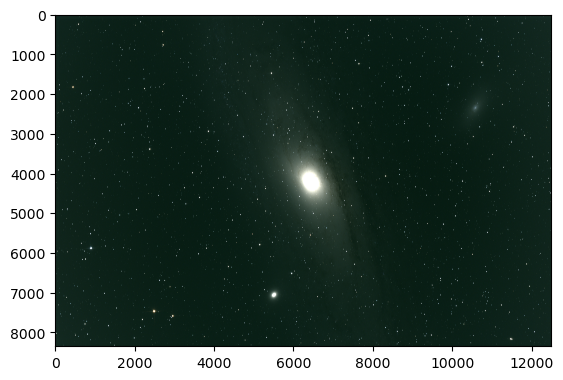

In [46]:
odp.display_rgb(stacked, scale='linear', clip_sigmas=5)

# Post-Processing

All the calibration, alignment, and stacking up to now has been pre-processing necessary to get one single image. From here the image is manipulated to arrive at something visually meaningful.

In [47]:
median_value = np.median(stacked)

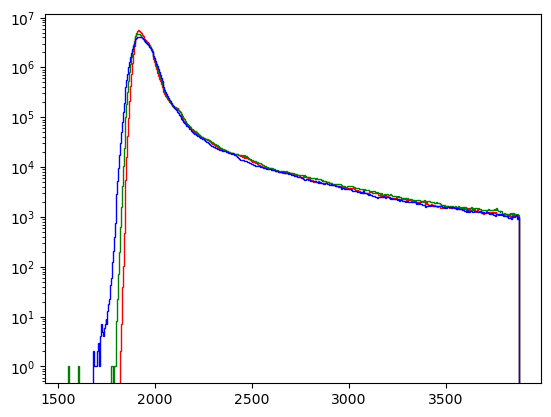

In [48]:
odp.show_hist(stacked, bins=np.linspace(median_value*0.8,median_value*2,500))
plt.yscale('log')

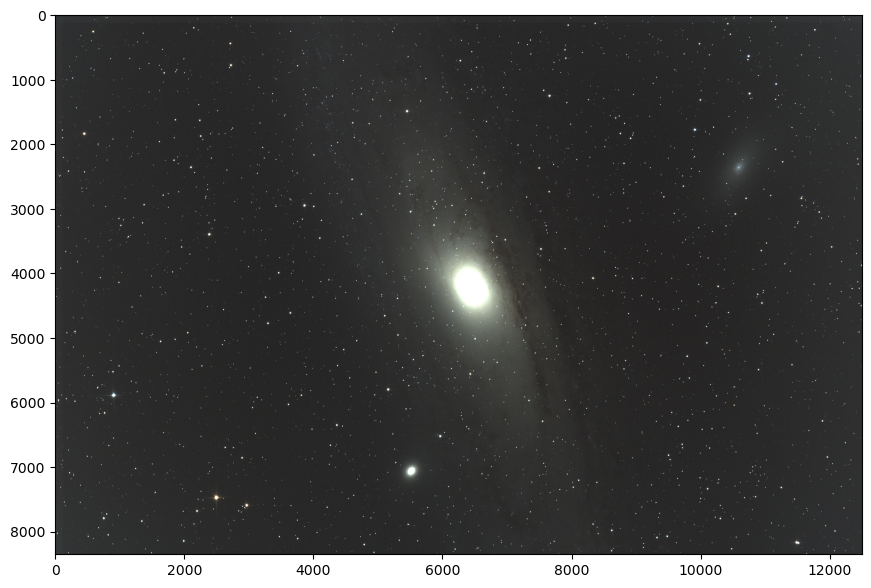

In [49]:
odp.linear_rgb(stacked, lower_limit=median_value*0.8, upper_limit=median_value*2, quality=95)

## Background Extraction

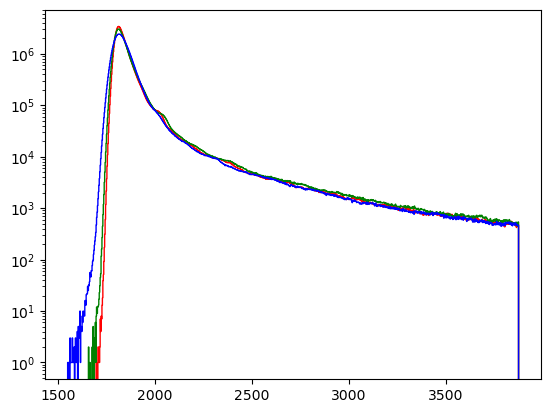

In [50]:
stacked_bkg,bkg = odp.polyfit_bkg_extract(stacked,order=5,return_bkg=True)
odp.show_hist(stacked_bkg, bins=np.linspace(median_value*0.8,median_value*2,1000))

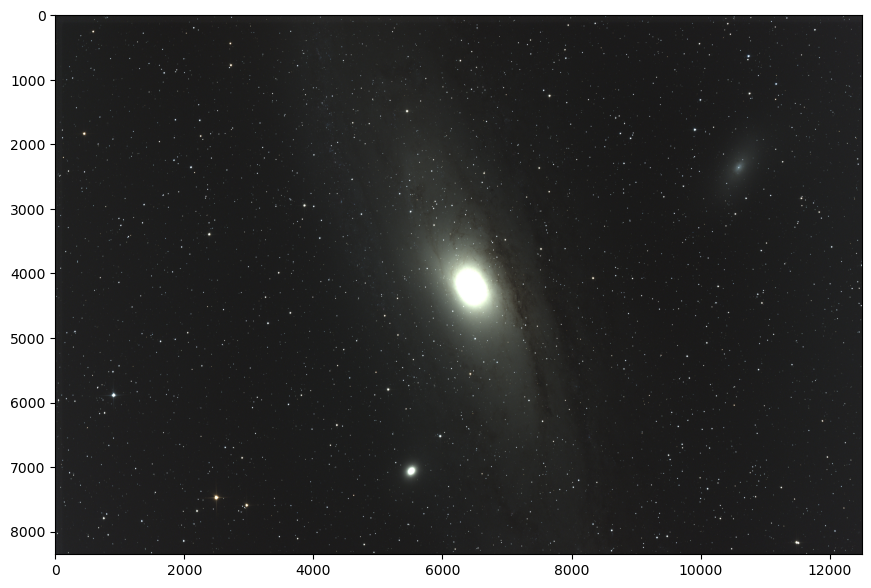

In [51]:
odp.linear_rgb(stacked_bkg, lower_limit=median_value*0.8, upper_limit=median_value*2, quality=95)

## Equalize

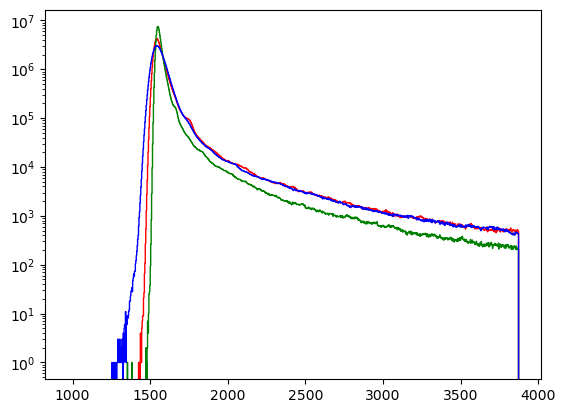

In [52]:
stacked_bkg_eq_base,med,sig  = odp.equalize_img(stacked_bkg, get_stats=True)
odp.show_hist(stacked_bkg_eq_base, bins=np.linspace(median_value*0.5,median_value*2,1000))

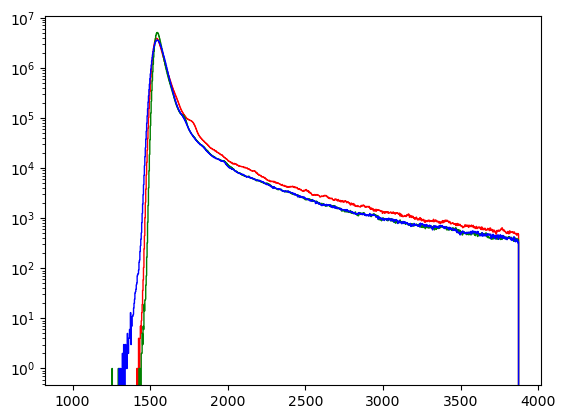

In [53]:
# The tails on the high end should be basically gray 
# The last step only equalized the background peaks
#scale = np.asarray([1.15,0.985,1.0],dtype=DTYPE)
scale = np.asarray([1.1,1.5,0.85],dtype=DTYPE)
stacked_bkg_eq = stacked_bkg_eq_base*scale-med*(scale-1)
odp.show_hist(stacked_bkg_eq, bins=np.linspace(median_value*0.5,median_value*2,1000))

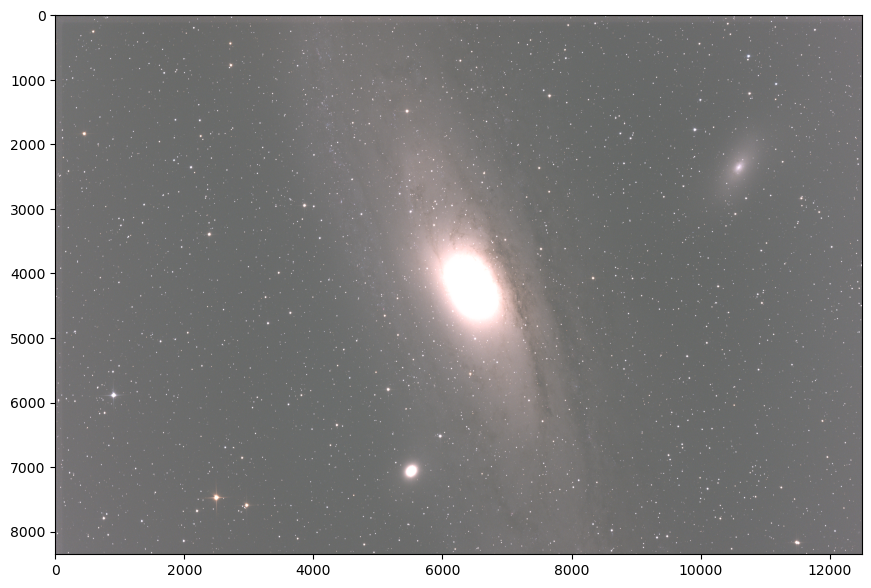

In [54]:
odp.linear_rgb(stacked_bkg_eq, lower_limit=median_value*0.5, upper_limit=median_value*1.2, quality=95)

## Blackpoint and Whitepoint

Convert from arbitrary (12-16 bit) scale to represented as DTYPE to normalized [0,1] as DTYPE from here on

In [55]:
from scipy.optimize import minimize

def histogram_metrics(rgb):
    hist_median,hist_sigma = np.median(rgb),np.std(rgb)
    counts,edges = np.histogram(rgb,bins=np.linspace(hist_median-hist_sigma*2,hist_median+hist_sigma*2,500))
    centers = (edges[:-1]+edges[1:])/2
    
    fit = minimize(odp.hist_bkg_residual(centers, counts), (hist_median,hist_sigma,0,np.max(rgb)), method='Nelder-Mead')
    fit.bkg_mean,fit.bkg_sig,fit.bkg_bkg,fit.bkg_peak = fit.x
    fit.hist_median,fit.hist_sigma = hist_median,hist_sigma
    
    return fit

odp.histogram_metrics = histogram_metrics

In [56]:
hist_fit = odp.histogram_metrics(stacked_bkg_eq)
hist_fit

       message: Maximum number of function evaluations has been exceeded.
       success: False
        status: 1
           fun: 102006725559982.08
             x: [ 1.551e+03 -1.914e+01 -2.428e+00  1.757e+07]
           nit: 352
          nfev: 800
 final_simplex: (array([[ 1.551e+03, -1.914e+01, -2.428e+00,  1.757e+07],
                       [ 1.551e+03, -1.914e+01, -2.428e+00,  1.757e+07],
                       ...,
                       [ 1.551e+03, -1.914e+01, -2.428e+00,  1.757e+07],
                       [ 1.551e+03, -1.914e+01, -2.428e+00,  1.757e+07]]), array([ 1.020e+14,  1.020e+14,  1.020e+14,  1.020e+14,
                        1.020e+14]))
      bkg_mean: 1550.7006452151938
       bkg_sig: -19.136705503079714
       bkg_bkg: -2.427908239808992
      bkg_peak: 17574977.446292028
   hist_median: 1556.7305
    hist_sigma: 548.47394

In [57]:
bp,wp,light_pp = odp.set_blackpoint_and_norm(stacked_bkg_eq, blackpoint=hist_fit.hist_median-BLACKPOINT_SIGMA*abs(hist_fit.bkg_sig))
print(f'Blackpoint {bp}; Whitepoint {wp}')
symmetry_point = (hist_fit.hist_median+SYMMETRY_SIGMA*abs(hist_fit.bkg_sig)-bp)/(wp-bp)
bkg_peak = (hist_fit.bkg_mean-bp)/(wp-bp)
print(f'Bkg Peak Location: {bkg_peak}; Optimal Stretch Symmetry: {symmetry_point}')

Blackpoint 1505.0613638916848; Whitepoint 57876.28515625
Bkg Peak Location: 0.0008096201972059355; Optimal Stretch Symmetry: 0.0010863247857705084


## Stretching

Using the [Generalized Hyperbolic Stretch](https://www.ghsastro.co.uk/doc/tools/GeneralizedHyperbolicStretch/GeneralizedHyperbolicStretch.html) strategy.

In [58]:
ghs_args = dict(symmetry_point=symmetry_point, form=1.0)
stretch_fit = minimize(odp.optimal_ghs_stretch(bkg_peak,0.09,symmetry_point=symmetry_point,form=1.0), 1, method='Powell')
print(stretch_fit)
ghs_args['stretch_factor'], = stretch_fit.x
print(ghs_args)

 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 1.4577363749066988e-30
       x: [ 5.042e+00]
     nit: 4
   direc: [[-1.807e-02]]
    nfev: 55
{'symmetry_point': np.float64(0.0010863247857705084), 'form': 1.0, 'stretch_factor': np.float64(5.041634772520547)}


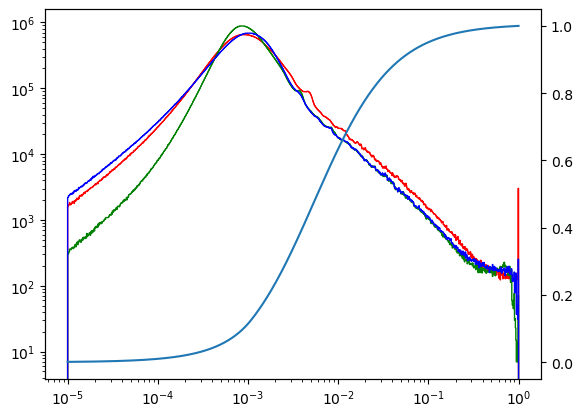

In [59]:
bins = np.logspace(-5,0,1000)
odp.show_hist(light_pp, bins=bins)
plt.xscale('log')
plt.twinx()

y = odp.ghs(bins, **ghs_args)
plt.plot(bins,y)

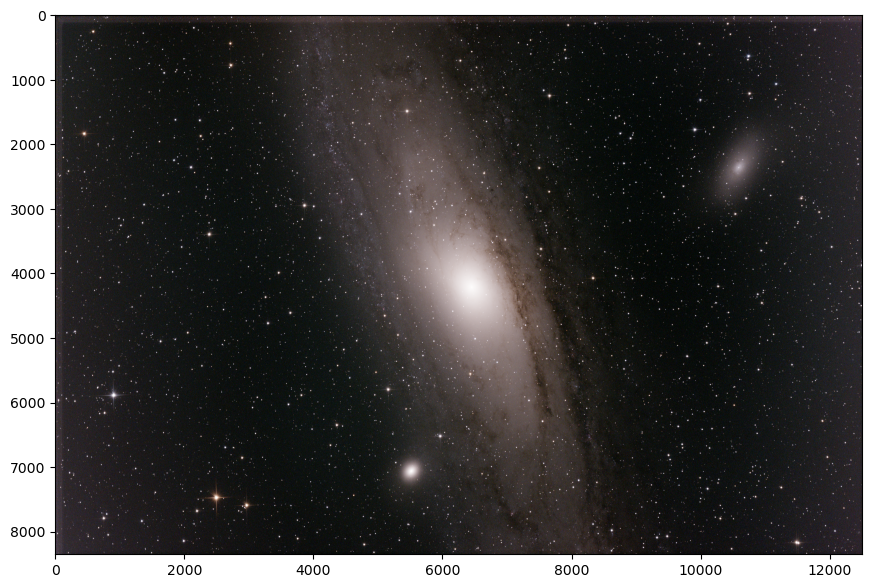

In [60]:
light_pp_ghs = odp.ghs(light_pp, **ghs_args)
odp.linear_rgb(light_pp_ghs, save=f'{tag}_pp_ghs.jpg', quality=95)

## HQ Output

For further manipulation

In [61]:
import cv2

In [62]:
data = np.flip(np.clip(light_pp_ghs*(2**16),0,2**16-1),axis=2).astype(dtype=np.uint16)
cv2.imwrite(f'{tag}.png',data)

True